<a href="https://colab.research.google.com/github/AhmedabdallahMandour/-AutoVision-Stitcher-Automated-Image-Processing-Alignment/blob/main/SAM_CODE_EGA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from IPython.display import display, HTML
display(HTML(
"""
<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything/blob/main/notebooks/onnx_model_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>
"""
))

In [ ]:
using_colab = True

In [ ]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib onnx onnxruntime
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg

    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.6.0+cu124
Torchvision version: 0.21.0+cu124
CUDA is available: True
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 121.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 121.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 9.4 MB/s eta 0:00:00
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-aollup_u
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-aollup_u
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=f49bb3c4d58fc9e40610323e68640b7a7c367c606dc4545fbf15691a2b7a77a1
  Stored in directory: /tmp/pip

In [ ]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
from segment_anything.utils.onnx import SamOnnxModel

import onnxruntime
from onnxruntime.quantization import QuantType
from onnxruntime.quantization.quantize import quantize_dynamic

In [ ]:
def show_mask(mask, ax):
    color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

In [ ]:
checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

In [ ]:
sam = sam_model_registry[model_type](checkpoint=checkpoint)

In [ ]:
onnx_model_path = None  # Set to use an already exported model, then skip to the next section.

In [ ]:
import warnings

onnx_model_path = "sam_onnx.onnx"

onnx_model = SamOnnxModel(sam, return_single_mask=True)

dynamic_axes = {
    "point_coords": {1: "num_points"},
    "point_labels": {1: "num_points"},
}

embed_dim = sam.prompt_encoder.embed_dim
embed_size = sam.prompt_encoder.image_embedding_size
mask_input_size = [4 * x for x in embed_size]
dummy_inputs = {
    "image_embeddings": torch.randn(1, embed_dim, *embed_size, dtype=torch.float),
    "point_coords": torch.randint(low=0, high=1024, size=(1, 5, 2), dtype=torch.float),
    "point_labels": torch.randint(low=0, high=4, size=(1, 5), dtype=torch.float),
    "mask_input": torch.randn(1, 1, *mask_input_size, dtype=torch.float),
    "has_mask_input": torch.tensor([1], dtype=torch.float),
    "orig_im_size": torch.tensor([1500, 2250], dtype=torch.float),
}
output_names = ["masks", "iou_predictions", "low_res_masks"]

with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=torch.jit.TracerWarning)
    warnings.filterwarnings("ignore", category=UserWarning)
    with open(onnx_model_path, "wb") as f:
        torch.onnx.export(
            onnx_model,
            tuple(dummy_inputs.values()),
            f,
            export_params=True,
            verbose=False,
            opset_version=17,
            do_constant_folding=True,
            input_names=list(dummy_inputs.keys()),
            output_names=output_names,
            dynamic_axes=dynamic_axes,
        )

In [ ]:
onnx_model_quantized_path = "sam_onnx_quantized_example.onnx"
quantize_dynamic(
    model_input=onnx_model_path,
    model_output=onnx_model_quantized_path,
    optimize_model=True,
    per_channel=False,
    reduce_range=False,
    weight_type=QuantType.QUInt8,
)
onnx_model_path = onnx_model_quantized_path

TypeError: quantize_dynamic() got an unexpected keyword argument 'optimize_model'

In [ ]:
image = cv2.imread('images/truck.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

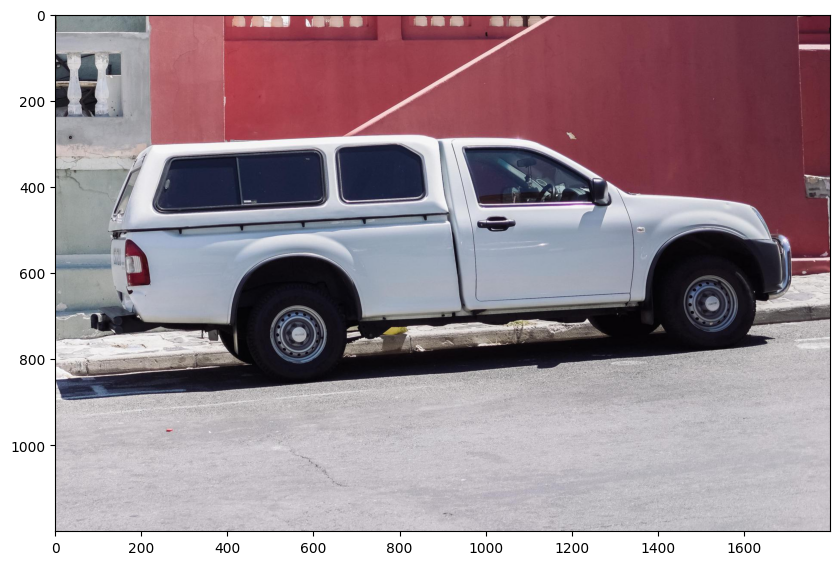

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

In [ ]:
ort_session = onnxruntime.InferenceSession(onnx_model_path)

In [ ]:
sam.to(device='cuda')
predictor = SamPredictor(sam)

In [ ]:
predictor.set_image(image)

In [ ]:
image_embedding = predictor.get_image_embedding().cpu().numpy()

In [ ]:
image_embedding.shape

(1, 256, 64, 64)

In [ ]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

In [ ]:
onnx_coord = np.concatenate([input_point, np.array([[0.0, 0.0]])], axis=0)[None, :, :]
onnx_label = np.concatenate([input_label, np.array([-1])], axis=0)[None, :].astype(np.float32)

onnx_coord = predictor.transform.apply_coords(onnx_coord, image.shape[:2]).astype(np.float32)


In [ ]:
onnx_mask_input = np.zeros((1, 1, 256, 256), dtype=np.float32)
onnx_has_mask_input = np.zeros(1, dtype=np.float32)

In [ ]:
ort_inputs = {
    "image_embeddings": image_embedding,
    "point_coords": onnx_coord,
    "point_labels": onnx_label,
    "mask_input": onnx_mask_input,
    "has_mask_input": onnx_has_mask_input,
    "orig_im_size": np.array(image.shape[:2], dtype=np.float32)
}

In [ ]:
masks, _, low_res_logits = ort_session.run(None, ort_inputs)
masks = masks > predictor.model.mask_threshold

In [ ]:
masks.shape

(1, 1, 1200, 1800)

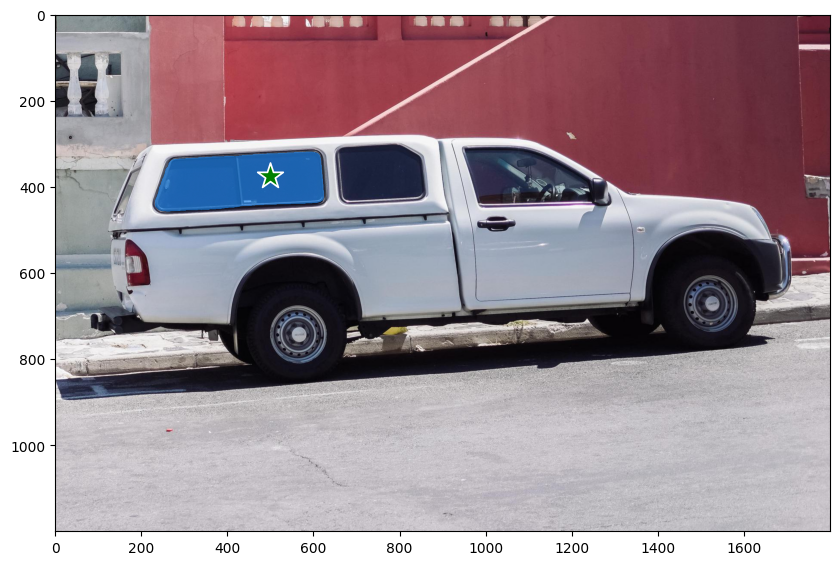

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.show()

In [ ]:
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

In [ ]:
onnx_box_coords = input_box.reshape(2, 2)
onnx_box_labels = np.array([2,3])

onnx_coord = np.concatenate([input_point, onnx_box_coords], axis=0)[None, :, :]
onnx_label = np.concatenate([input_label, onnx_box_labels], axis=0)[None, :].astype(np.float32)

onnx_coord = predictor.transform.apply_coords(onnx_coord, image.shape[:2]).astype(np.float32)

In [ ]:
onnx_mask_input = np.zeros((1, 1, 256, 256), dtype=np.float32)
onnx_has_mask_input = np.zeros(1, dtype=np.float32)

ort_inputs = {
    "image_embeddings": image_embedding,
    "point_coords": onnx_coord,
    "point_labels": onnx_label,
    "mask_input": onnx_mask_input,
    "has_mask_input": onnx_has_mask_input,
    "orig_im_size": np.array(image.shape[:2], dtype=np.float32)
}

masks, _, _ = ort_session.run(None, ort_inputs)
masks = masks > predictor.model.mask_threshold

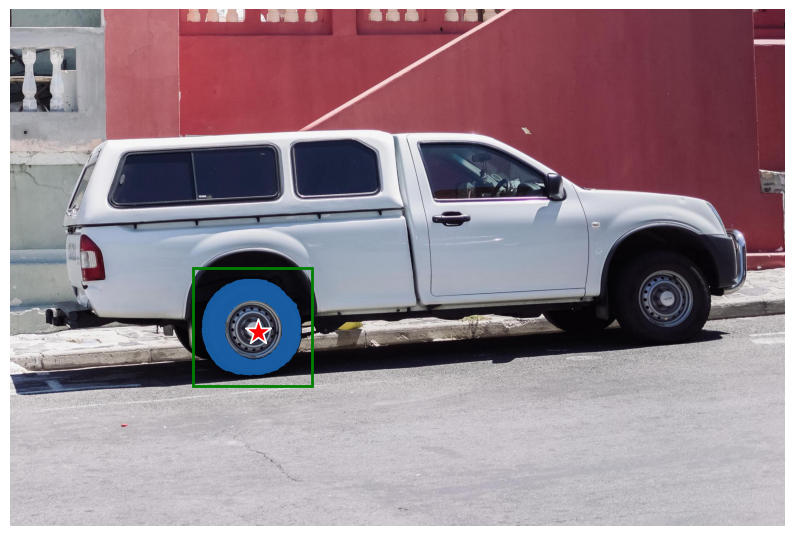

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

In [21]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Image read successfully.
600 545 1.1009174311926606 1.0992063492063493


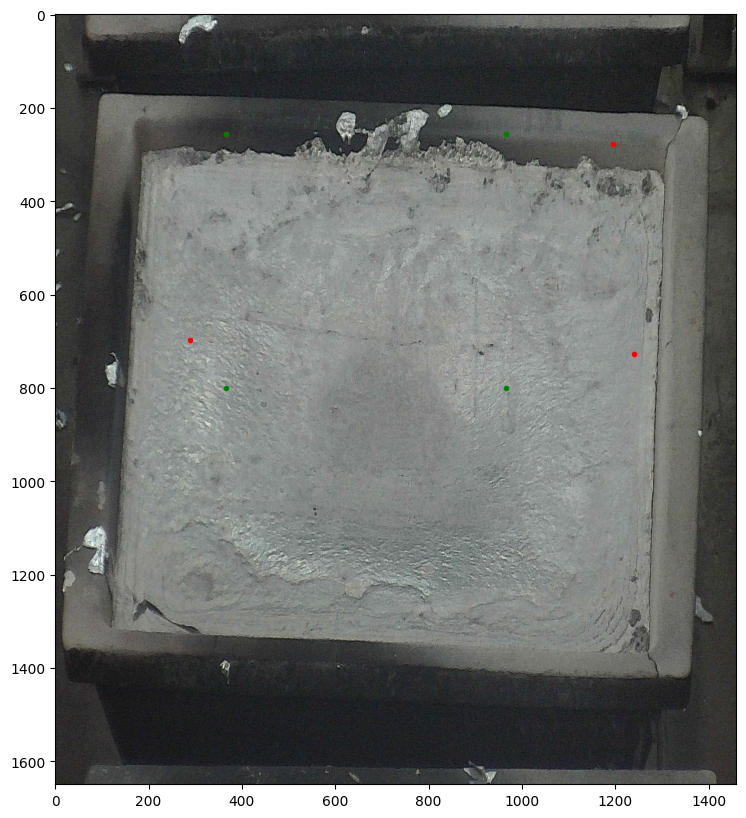

(1650, 1460, 3)

In [ ]:
# prompt: Read an image and plot 4 points on it

import matplotlib.pyplot as plt
import cv2
import numpy as np # Import numpy

# Assuming 'image' is already loaded as a NumPy array (from your provided code)
# If not, load it first:
image = cv2.imread('/content/drive/My Drive/-0-78551_20250424_033110.jpg')
if image is None:
    print("Error: Could not read the image.")
    exit()
else:
    print("Image read successfully.")
    # Convert the image from BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define the coordinates of the 4 points
points = [(367, 255), (288, 698), (1240, 728), (1195, 278)]
            #.top_left,  Buttom_left, buttom_right, Top_right

st_x, st_y = (367, 255)
h = 600
w = int(h*(1260/1385))
new_points = [(st_x, st_y), (st_x, st_y+w), (st_x+h, st_y+w), (st_x+h, st_y)]

print(h, w, h/w, 1385/1260)

# Create the plot
plt.figure(figsize=(10, 10))
plt.imshow(image)

# Plot the points
for point in points:
    plt.plot(point[0], point[1], marker='o', markersize=3, color='red')


for point in new_points:
    plt.plot(point[0], point[1], marker='o', markersize=3, color='green')

# Show the plot
plt.show()

image.shape

# # Replace with your actual points
# pts1 = np.float32(points) # Example source points
# pts2 = np.float32(new_points) # Example destination points

# # Perform perspective transformation
# matrix = cv2.getPerspectiveTransform(pts1, pts2)
# transformed_img = cv2.warpPerspective(image, matrix, (1600, 899))
# # Create the plot
# plt.figure(figsize=(10, 10))
# plt.imshow(transformed_img)
# plt.show()

In [ ]:
# # prompt: Read all the images in the images folder and make a prespective transformation based on 4 points and save them to another folder, images_transformed

# import os
# import cv2
# import numpy as np

# def perspective_transform_images(input_folder, output_folder):
#     """
#     Reads images from a folder, performs a perspective transformation, and saves them to another folder.

#     Args:
#         input_folder: Path to the input folder containing images.
#         output_folder: Path to the output folder where transformed images will be saved.
#     """

#     if not os.path.exists(output_folder):
#         os.makedirs(output_folder)

#     for filename in os.listdir(input_folder):
#         if filename.endswith(('.jpg', '.jpeg', '.png')):  # Adjust extensions if needed
#             img_path = os.path.join(input_folder, filename)
#             img = cv2.imread(img_path)

#             if img is not None:
#                 # Define source and destination points for perspective transformation
#                 # Replace with your actual points
#                 pts1 = np.float32(points) # Example source points
#                 pts2 = np.float32(new_points) # Example destination points

#                 # Perform perspective transformation
#                 matrix = cv2.getPerspectiveTransform(pts1, pts2)
#                 transformed_img = cv2.warpPerspective(img, matrix, (1600, 1000)) # Adjust output size if needed

#                 # Save the transformed image
#                 output_path = os.path.join(output_folder, filename)
#                 cv2.imwrite(output_path, transformed_img)
#             else:
#                 print(f"Error loading image: {img_path}")


# # Example usage:
# input_folder = 'images'
# output_folder = 'images_transformed'
# perspective_transform_images(input_folder, output_folder)


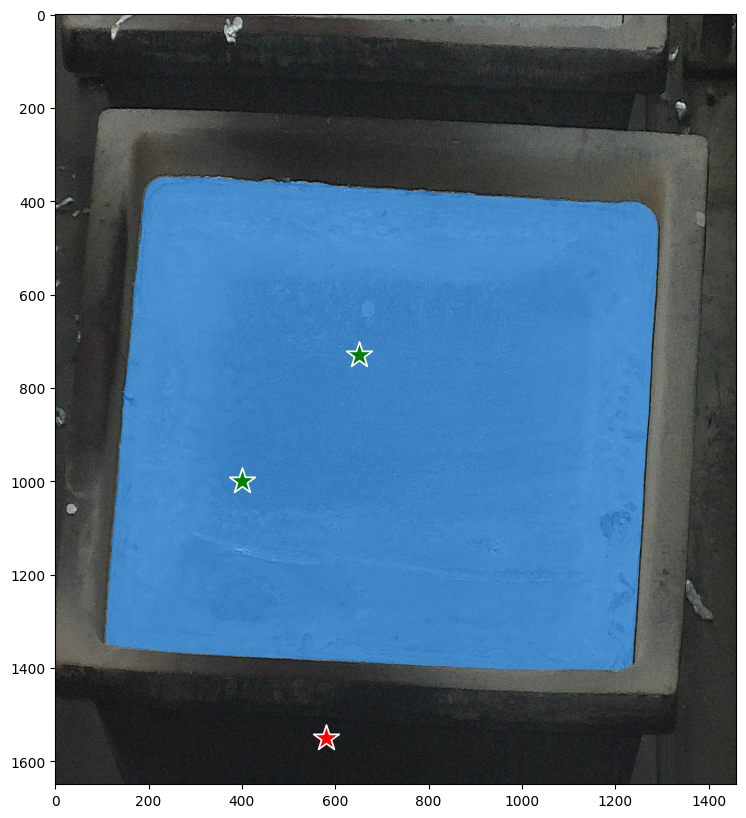

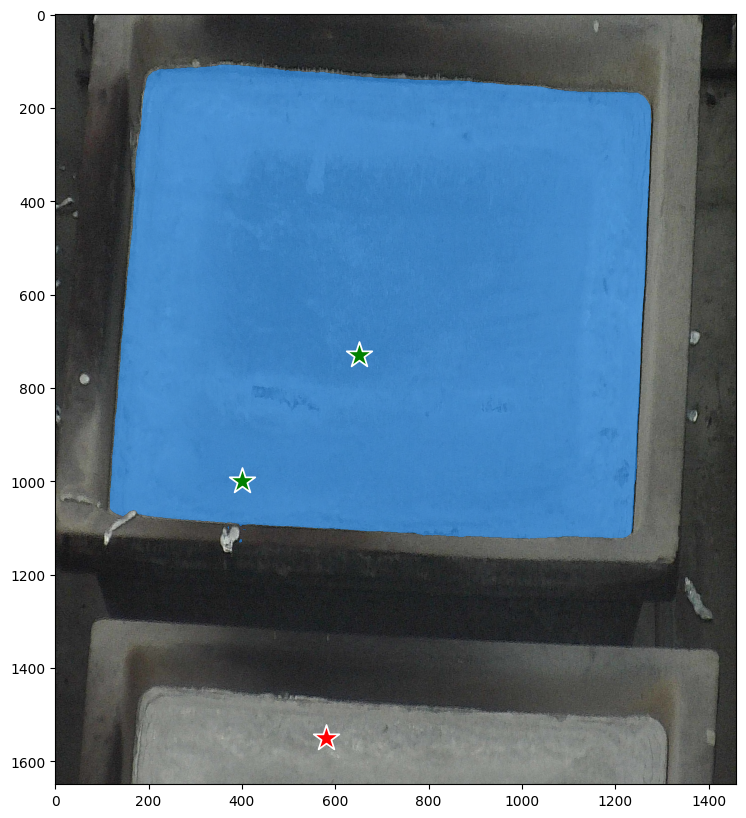

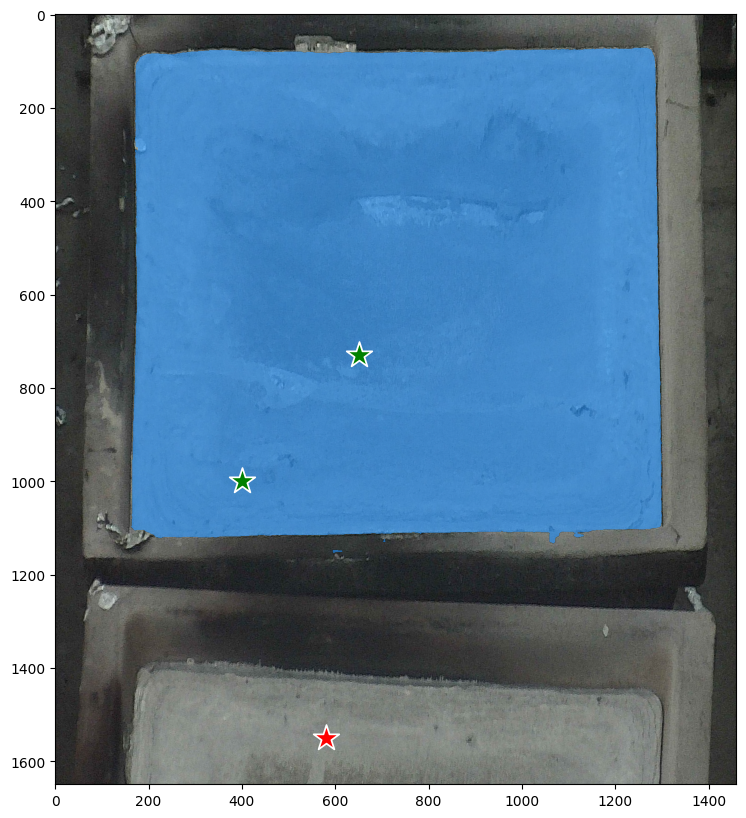

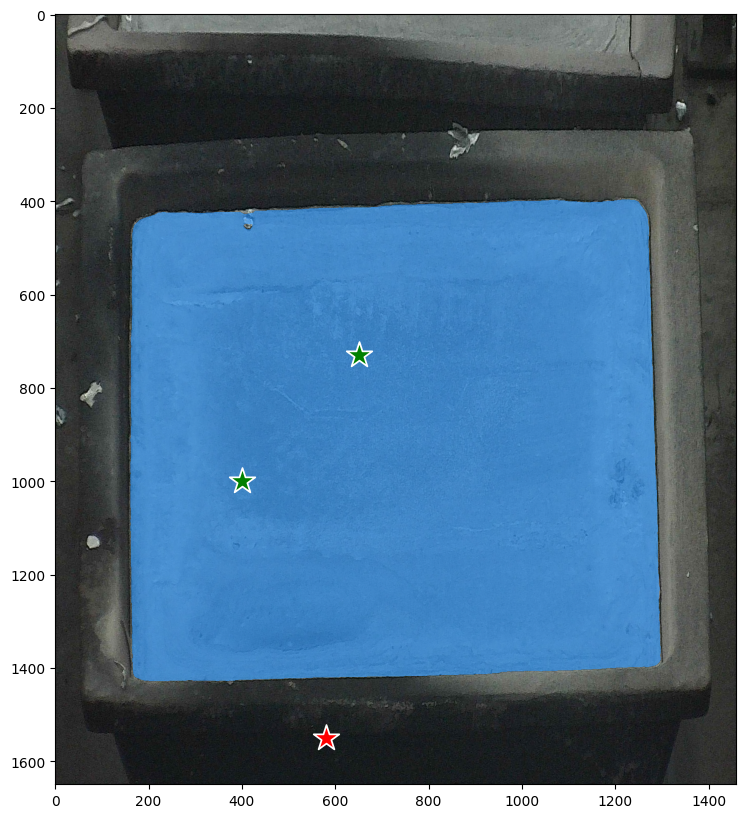

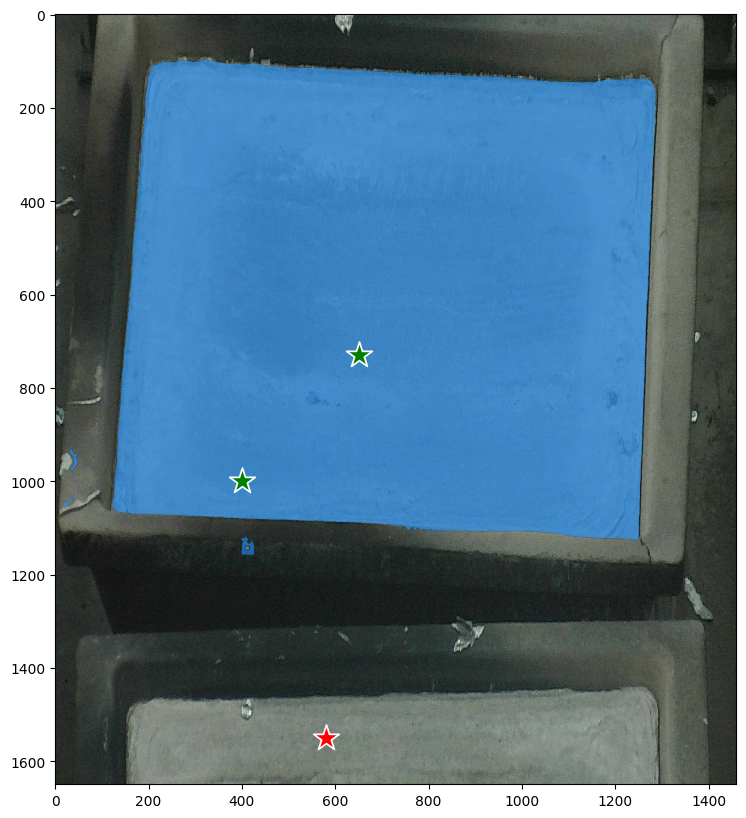

...

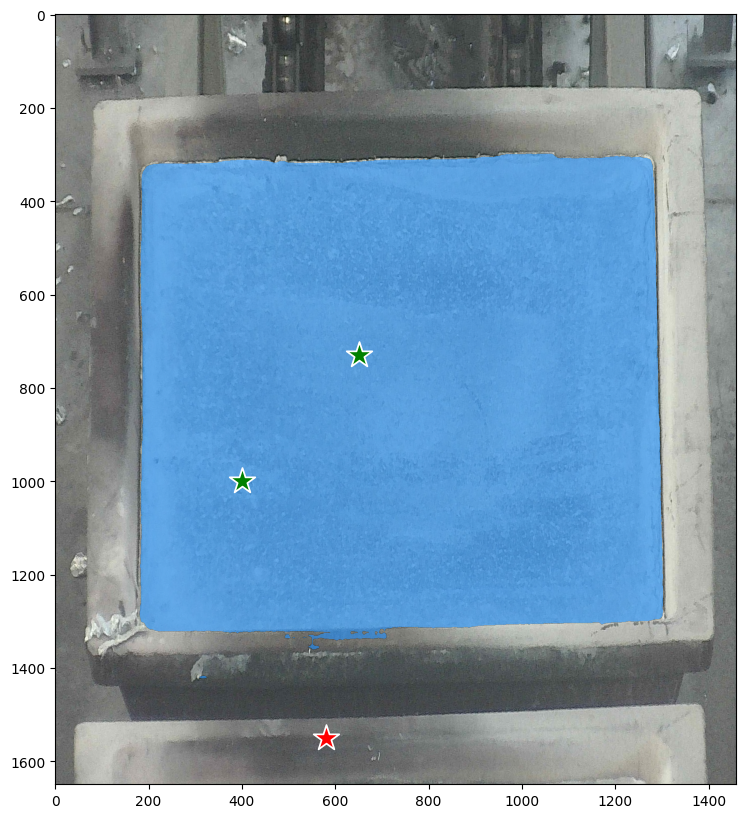

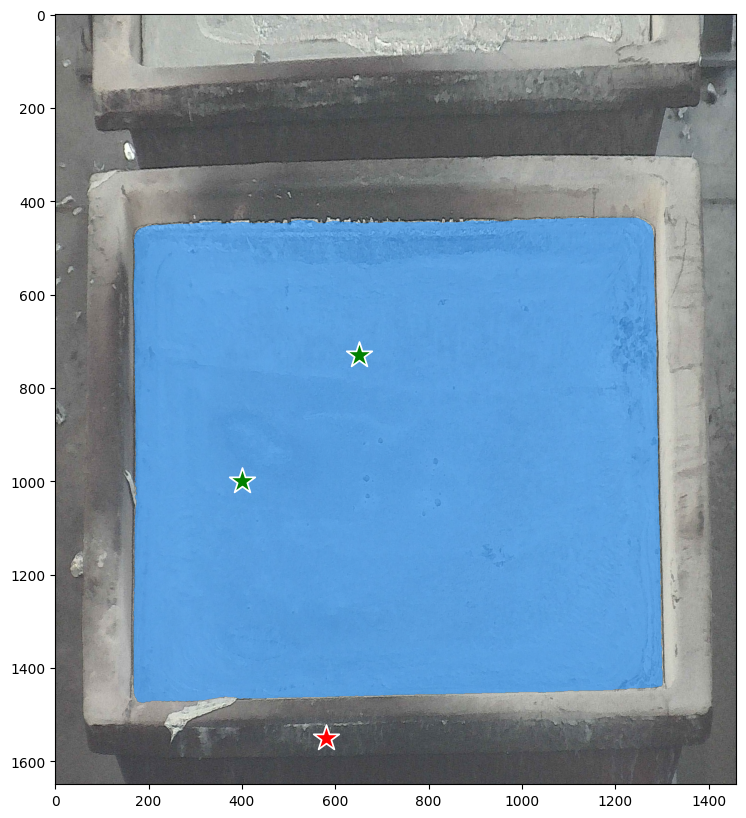

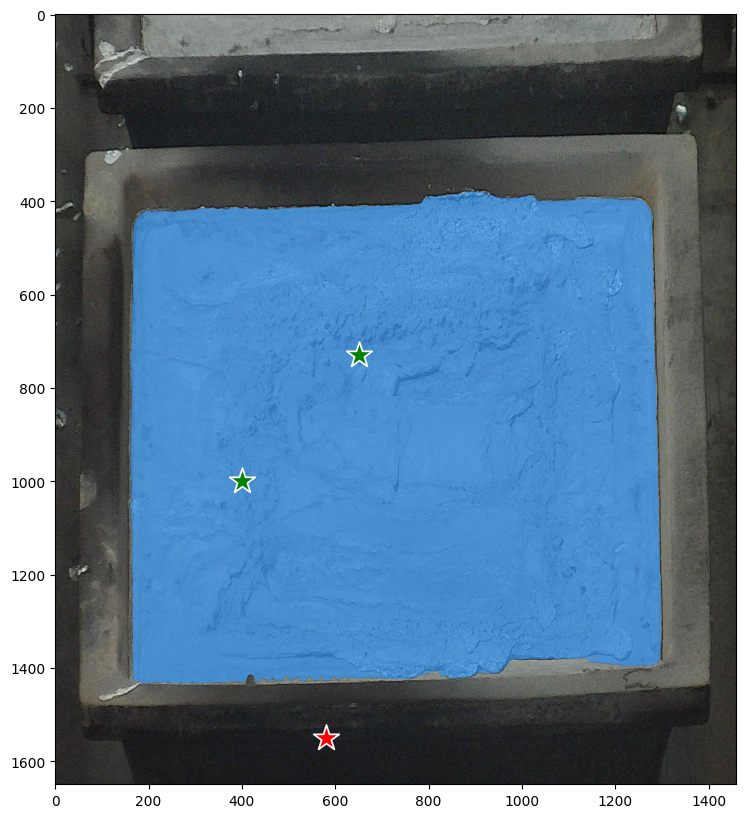

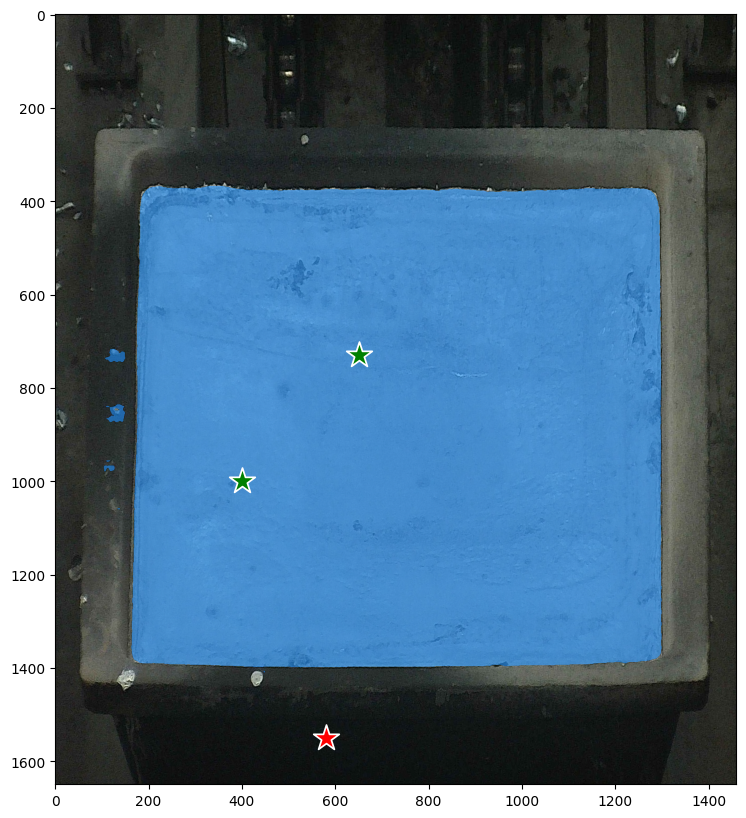

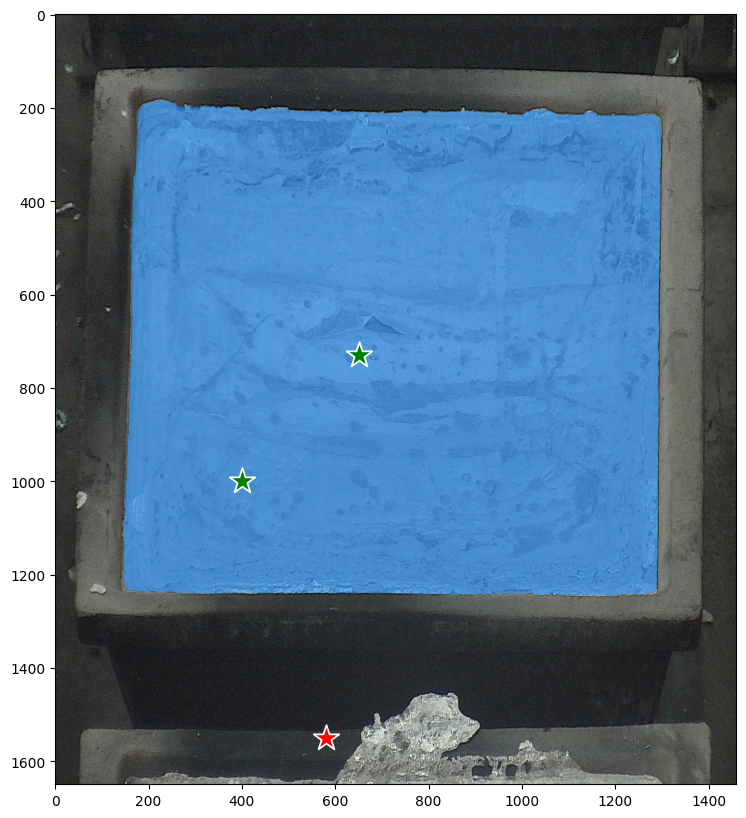

In [10]:
# prompt: Read each image from the folder "images" and run sam model onnx on it

import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import onnxruntime

from segment_anything import sam_model_registry, SamPredictor

# Assuming 'sam_onnx.onnx' is in the current directory or provide the correct path
onnx_model_path = "sam_onnx.onnx"
ort_session = onnxruntime.InferenceSession(onnx_model_path)

# Load the SAM model (replace with your actual checkpoint)
checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"
sam = sam_model_registry[model_type](checkpoint=checkpoint)
sam.to(device='cuda')
predictor = SamPredictor(sam)

all_masks = []

# Define show_mask and other helper functions
def show_mask(mask, ax):
    color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))


def process_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    predictor.set_image(image)
    image_embedding = predictor.get_image_embedding().cpu().numpy()

    # Example point input (adjust coordinates as needed)
    input_point = np.array([[500, 500], [650, 600], [800, 700]])
    input_label = np.array([1, 1, 1])


    input_point = np.array([[400,1000],[650, 730], [580, 1550]])
    input_label = np.array([1 ,1, 0])

    onnx_coord = np.concatenate([input_point, np.array([[0.0, 0.0]])], axis=0)[None, :, :]
    onnx_label = np.concatenate([input_label, np.array([-1])], axis=0)[None, :].astype(np.float32)
    onnx_coord = predictor.transform.apply_coords(onnx_coord, image.shape[:2]).astype(np.float32)
    onnx_mask_input = np.zeros((1, 1, 256, 256), dtype=np.float32)
    onnx_has_mask_input = np.zeros(1, dtype=np.float32)

    ort_inputs = {
        "image_embeddings": image_embedding,
        "point_coords": onnx_coord,
        "point_labels": onnx_label,
        "mask_input": onnx_mask_input,
        "has_mask_input": onnx_has_mask_input,
        "orig_im_size": np.array(image.shape[:2], dtype=np.float32)
    }

    masks, _, _ = ort_session.run(None, ort_inputs)
    masks = masks > predictor.model.mask_threshold

    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    # Show mask and points (optional)
    all_masks.append(masks[0])
    show_mask(masks[0], plt.gca()) # uncomment to display mask
    show_points(input_point, input_label, plt.gca()) # uncomment to display points
    plt.show()

# Specify the folder containing images
image_folder = '/content/drive/MyDrive/Images '

# Iterate over files in the folder
for filename in os.listdir(image_folder):
    if filename.endswith((".jpg", ".jpeg", ".png")):  # Add other image extensions if needed
        image_path = os.path.join(image_folder, filename)
        process_image(image_path)

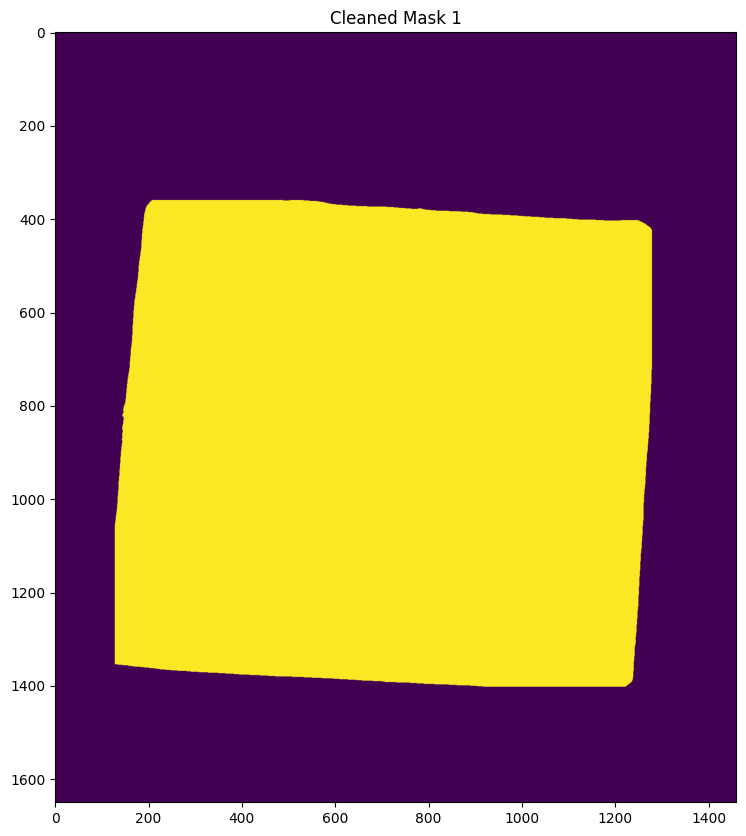

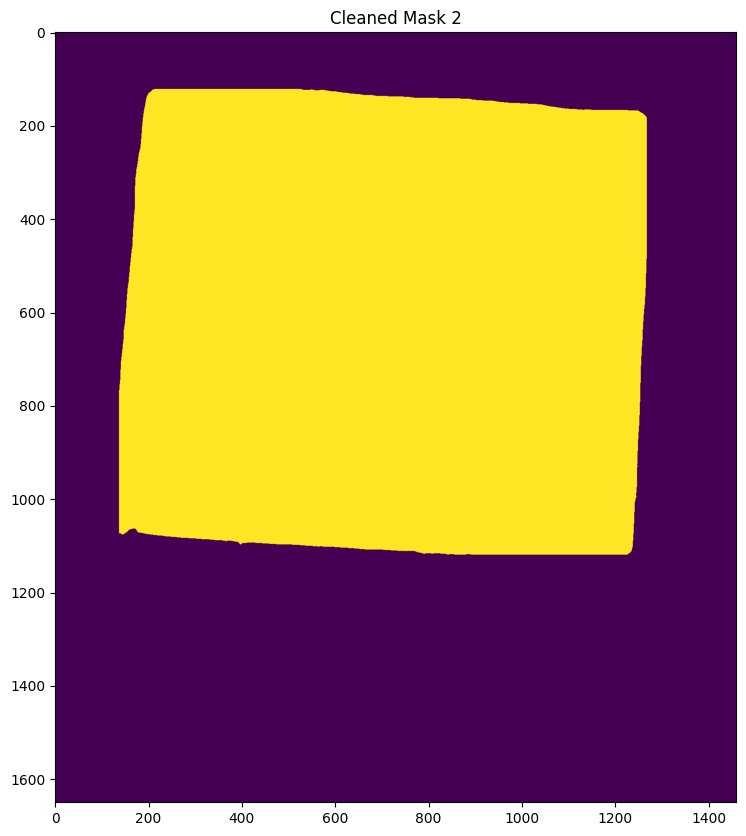

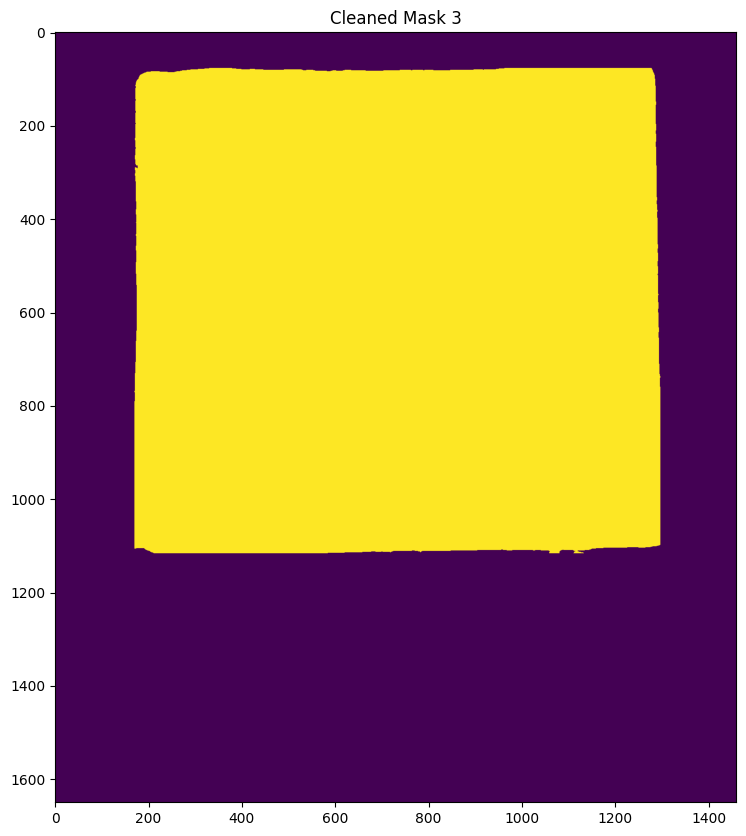

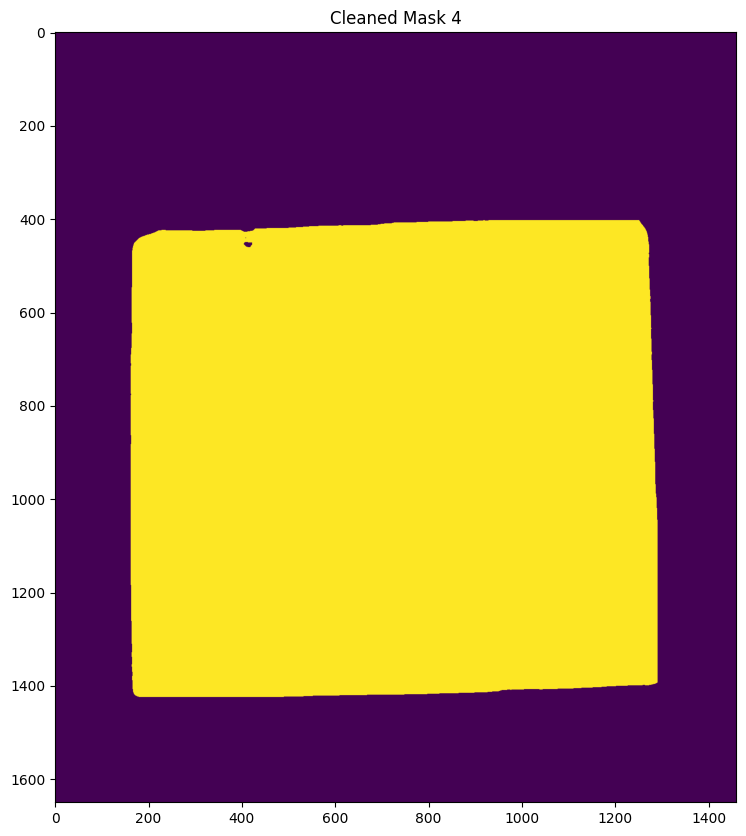

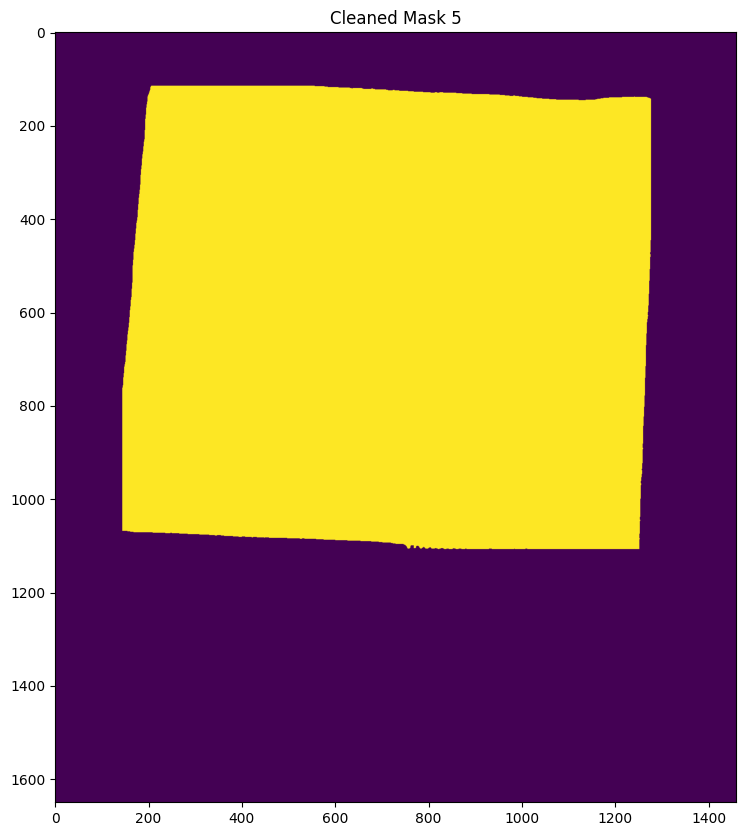

...

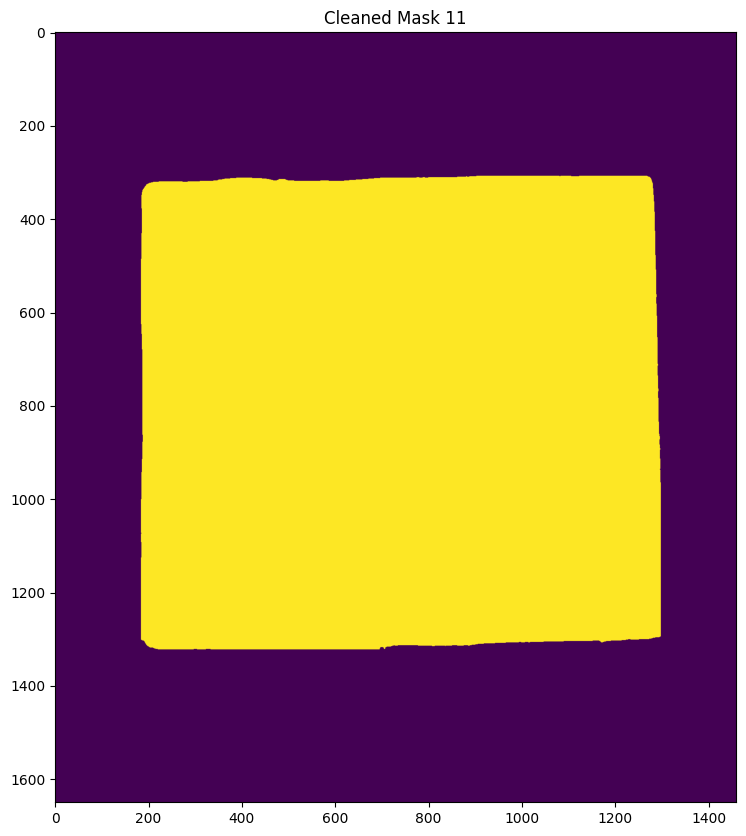

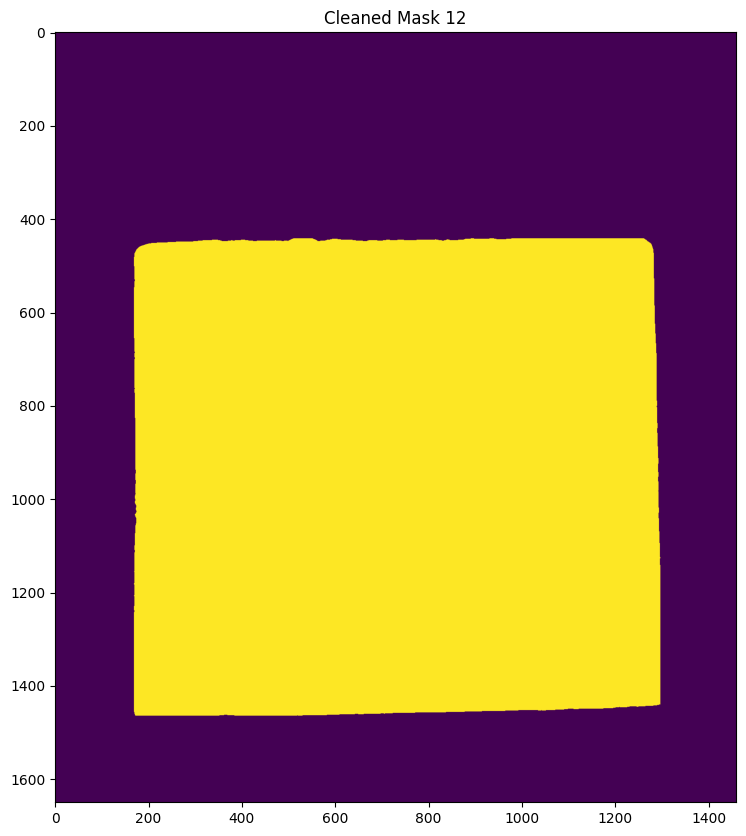

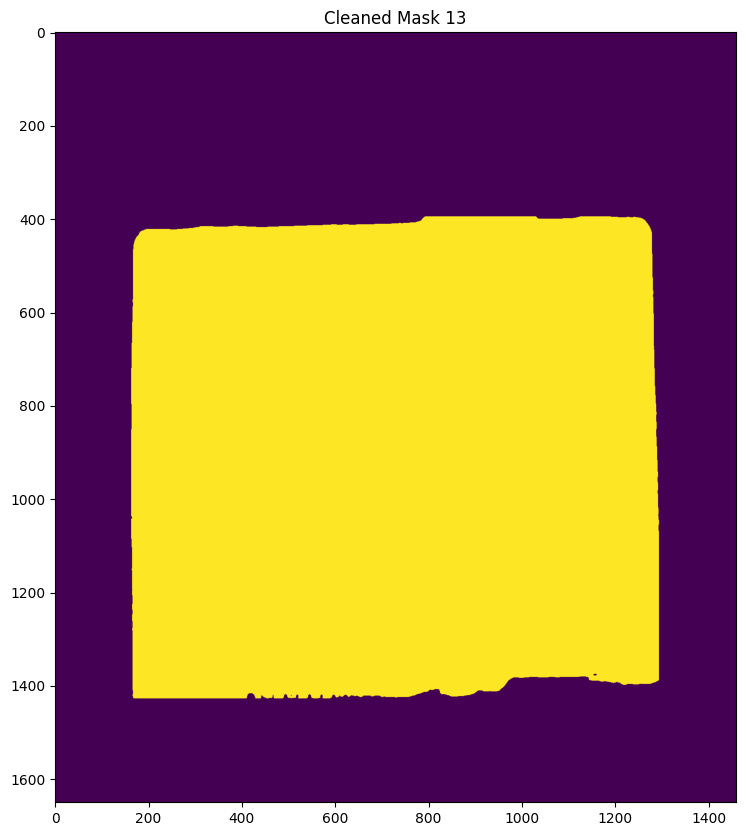

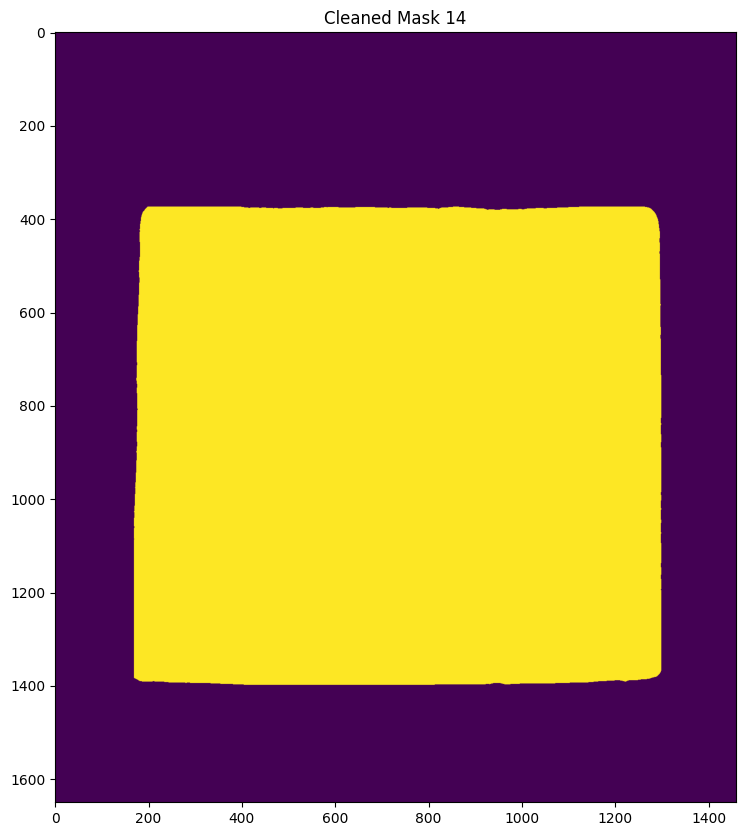

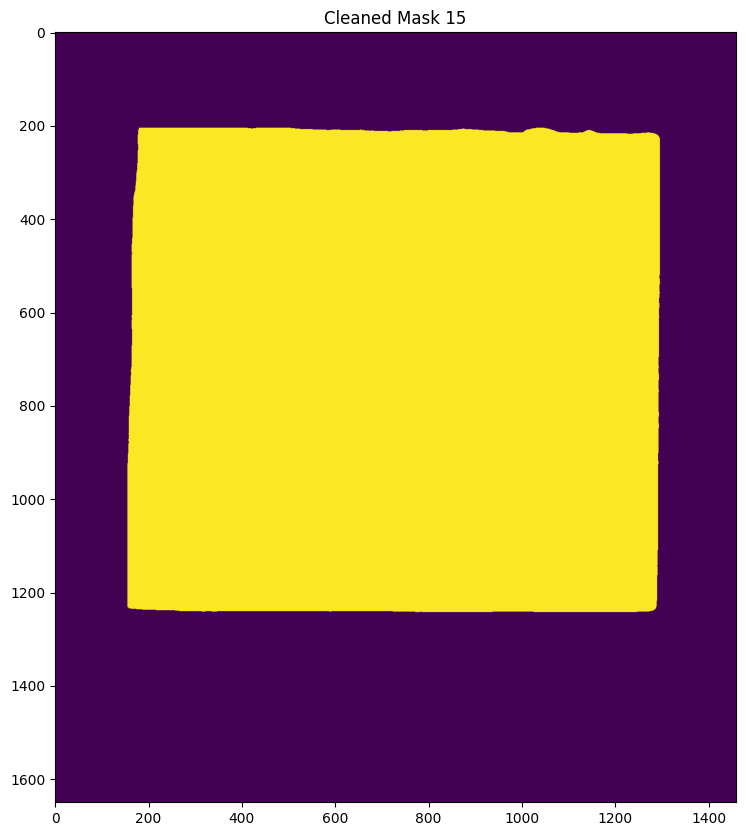

In [14]:
# prompt: after cleaning the mask, run connected components and get the biggest component

import matplotlib.pyplot as plt
import cv2
import numpy as np

def get_largest_component(mask):
    # Find connected components
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask.astype(np.uint8), connectivity=8)

    # Find the largest component (excluding background)
    largest_label = 1
    max_area = 0
    for i in range(1, num_labels):  # Start from 1 to exclude background
        if stats[i, cv2.CC_STAT_AREA] > max_area:
            max_area = stats[i, cv2.CC_STAT_AREA]
            largest_label = i

    # Create a mask of the largest component
    largest_component_mask = (labels == largest_label).astype(bool)

    return largest_component_mask

# prompt: A function to clean a mask, by making any row or column with less than a certain threshold false, then we pass a mask to this function and try to plot it

import matplotlib.pyplot as plt
import numpy as np

def clean_mask(mask, threshold):
    """
    Cleans a mask by setting rows and columns with less than a certain threshold to False.

    Args:
        mask: A NumPy array representing the mask.
        threshold: The minimum number of True values required in a row or column.

    Returns:
        A cleaned NumPy array representing the mask.
    """
    cleaned_mask = mask.copy()  # Create a copy to avoid modifying the original mask

    for _ in range(3):
        # Iterate over rows
        for i in range(cleaned_mask.shape[0]):
            if np.sum(cleaned_mask[i, :]) < threshold:
                cleaned_mask[i, :] = False

        # Iterate over columns
        for j in range(cleaned_mask.shape[1]):
            if np.sum(cleaned_mask[:, j]) < threshold:
                cleaned_mask[:, j] = False
    return cleaned_mask


# Example usage (assuming 'masks' is a list of masks from your previous code):
# Assuming all_masks contains the mask you want to clean
for i, mask in enumerate(all_masks[:15]):
    h, w = mask.shape[-2:]
    cleaned_mask = mask.reshape(h, w, 1)
    largest_mask = get_largest_component(cleaned_mask)

    cleaned_mask = clean_mask(largest_mask, threshold=300) # Adjust threshold as needed

    largest_mask = get_largest_component(cleaned_mask)

    plt.figure(figsize=(10, 10))
    plt.imshow(largest_mask)
    plt.title(f"Cleaned Mask {i+1}")
    plt.show()



# Example usage (assuming 'masks' is your list of masks from the previous code)
# for mask in all_masks:
#   largest_mask = get_largest_component(mask)
#   plt.figure(figsize=(10, 10))
#   plt.imshow(largest_mask, cmap='gray') # Display the largest component mask
#   plt.show()


In [15]:
cleaned_mask.sum(axis=0).squeeze()[300:1000] #1600
cleaned_mask.sum(axis=1).squeeze()[200:1000] #1000


array([   0,    0,    0,    0,    0,  324,  361,  391,  448,  535,  712,
        783,  863,  883,  897,  968, 1013, 1093, 1109, 1110, 1113, 1114,
       1115, 1116, 1116, 1117, 1117, 1118, 1118, 1118, 1118, 1118, 1118,
       1118, 1118, 1118, 1118, 1118, 1118, 1118, 1117, 1117, 1117, 1117,
       1117, 1117, 1117, 1117, 1117, 1117, 1117, 1117, 1117, 1117, 1118,
       1118, 1118, 1118, 1118, 1118, 1118, 1118, 1118, 1118, 1118, 1118,
       1118, 1118, 1118, 1118, 1118, 1118, 1118, 1118, 1118, 1118, 1118,
       1118, 1118, 1118, 1118, 1119, 1119, 1119, 1119, 1119, 1119, 1119,
       1119, 1119, 1119, 1119, 1119, 1119, 1119, 1119, 1120, 1120, 1120,
       1120, 1120, 1120, 1121, 1121, 1121, 1121, 1121, 1121, 1121, 1121,
       1121, 1121, 1121, 1121, 1121, 1121, 1121, 1121, 1121, 1122, 1122,
       1122, 1122, 1122, 1122, 1122, 1122, 1122, 1122, 1123, 1123, 1123,
       1123, 1123, 1123, 1123, 1123, 1123, 1123, 1123, 1124, 1124, 1124,
       1125, 1125, 1125, 1125, 1126, 1126, 1126, 11

Rotated Rectangle for Mask 1: [[ 106.07898 1358.8945 ]
 [ 167.37988  338.16254]
 [1298.0812   406.06787]
 [1236.7803  1426.7998 ]]


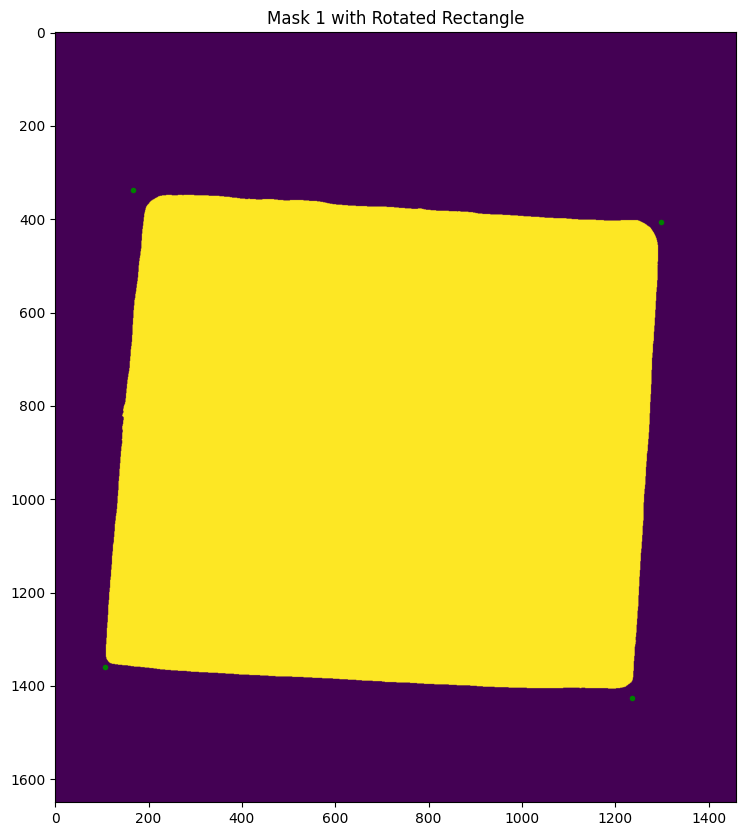

Rotated Rectangle for Mask 2: [[ 112.79529 1077.4688 ]
 [ 180.60596   94.2142 ]
 [1300.7954   171.46863]
 [1232.9847  1154.7231 ]]


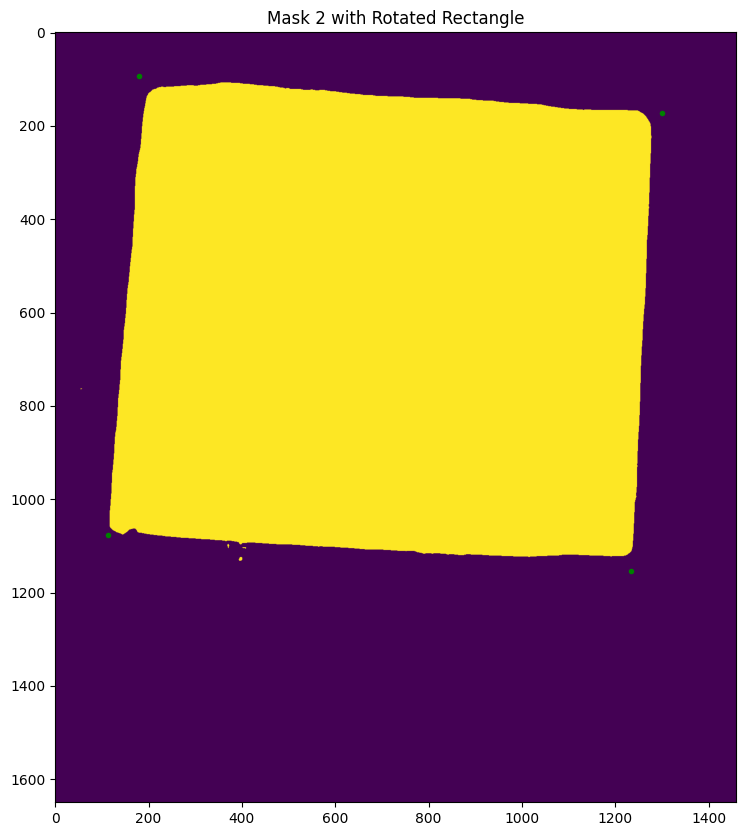

Rotated Rectangle for Mask 3: [[ 158.38036   76.88422]
 [1294.4792    71.74921]
 [1299.2756  1132.9502 ]
 [ 163.17676 1138.0852 ]]


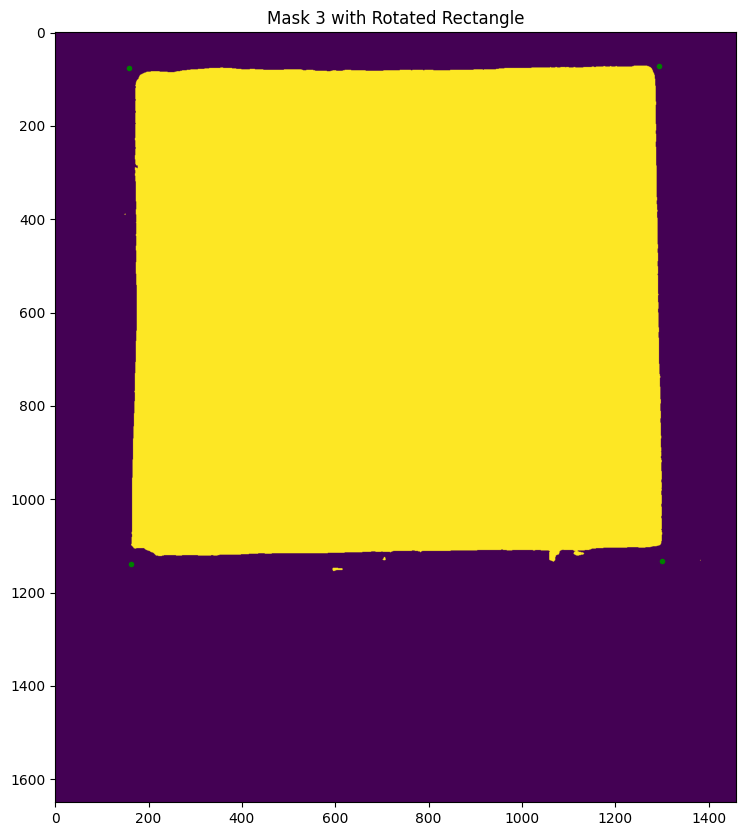

Rotated Rectangle for Mask 4: [[ 138.2893   423.12387]
 [1271.0607   392.00388]
 [1298.8678  1404.1849 ]
 [ 166.09644 1435.3049 ]]


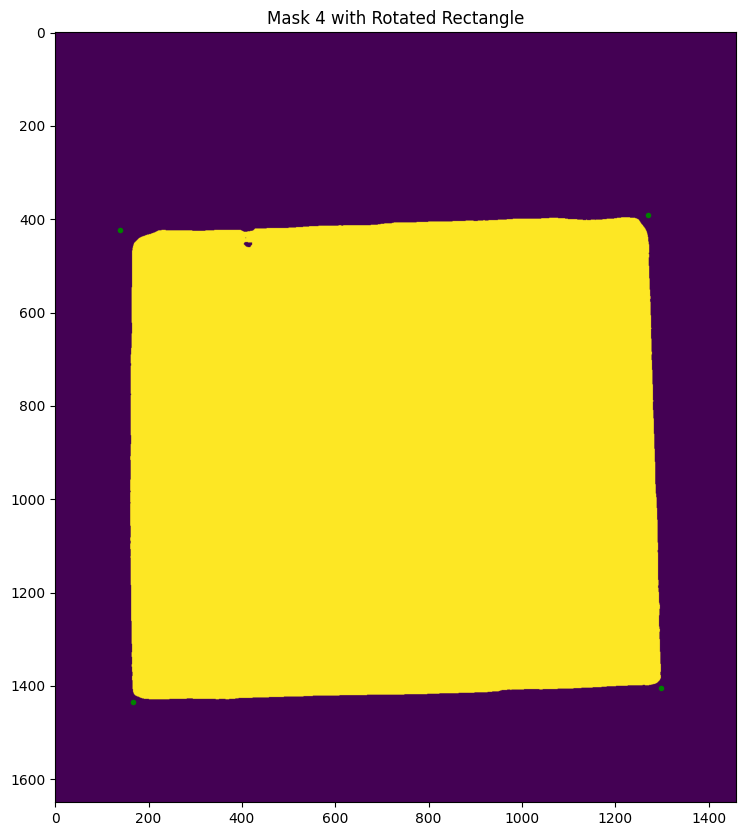

Rotated Rectangle for Mask 5: [[ 120.72974 1074.9336 ]
 [ 169.20264   85.2793 ]
 [1297.7766   140.5564 ]
 [1249.3037  1130.2107 ]]


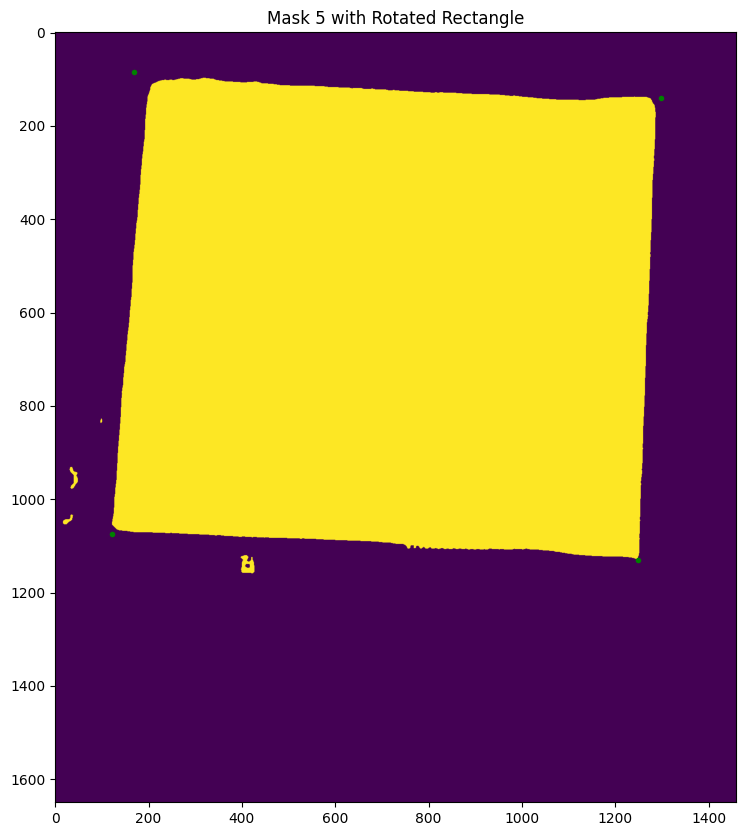

Rotated Rectangle for Mask 6: [[ 133.46088 1314.579  ]
 [ 174.51447  270.4488 ]
 [1309.1982   315.06287]
 [1268.1445  1359.1931 ]]


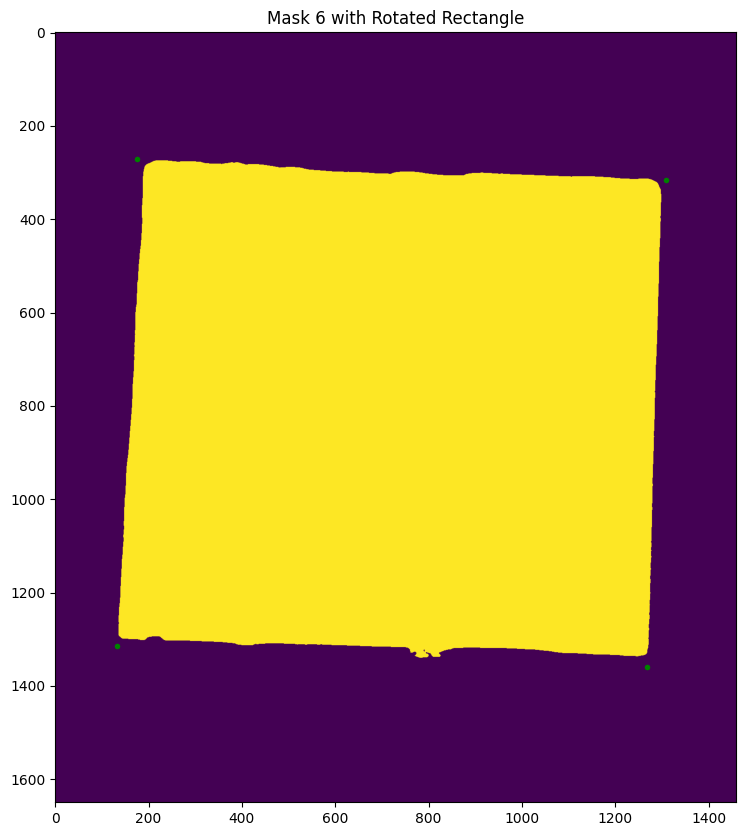

Rotated Rectangle for Mask 7: [[ 131.02313 1335.0756 ]
 [ 156.1568   329.72888]
 [1285.426    357.96057]
 [1260.2922  1363.3073 ]]


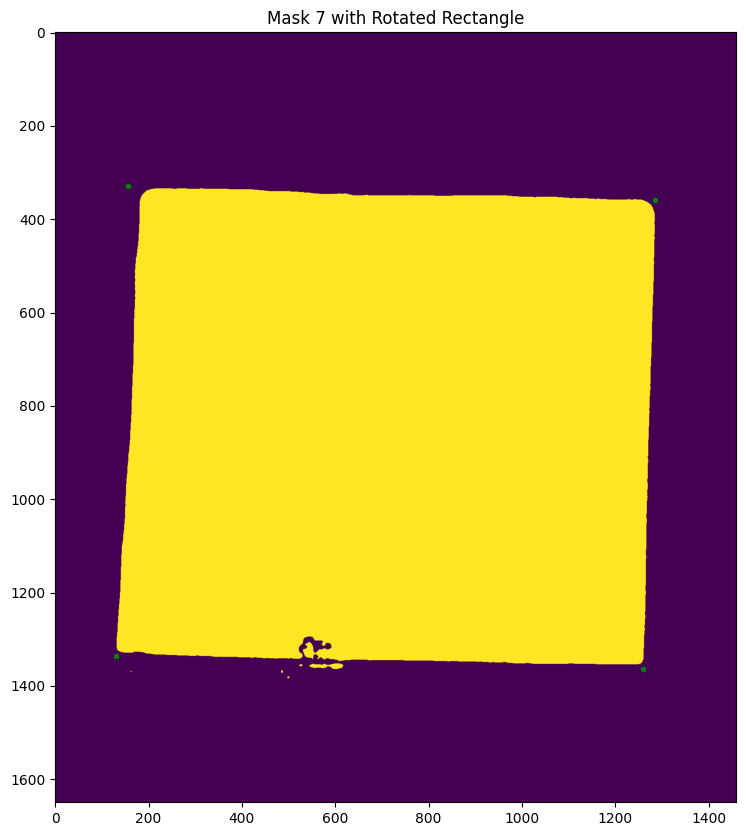

Rotated Rectangle for Mask 8: [[ 104.20819 1299.9408 ]
 [ 144.68317  262.164  ]
 [1288.3865   306.77026]
 [1247.9116  1344.5471 ]]


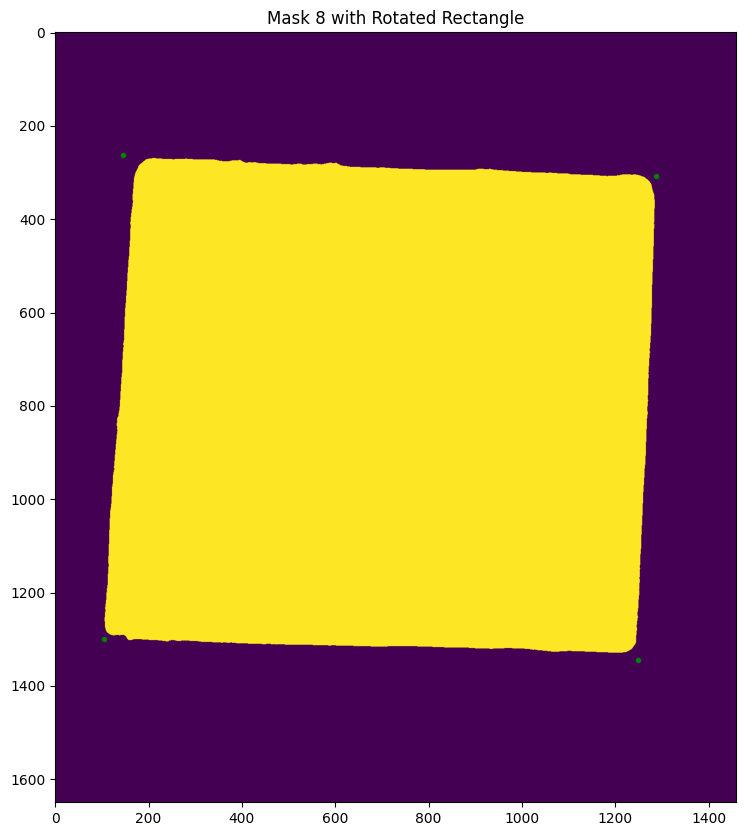

Rotated Rectangle for Mask 9: [[ 128.36142  350.46136]
 [1261.3766   348.5854 ]
 [1263.139   1413.0264 ]
 [ 130.1239  1414.9023 ]]


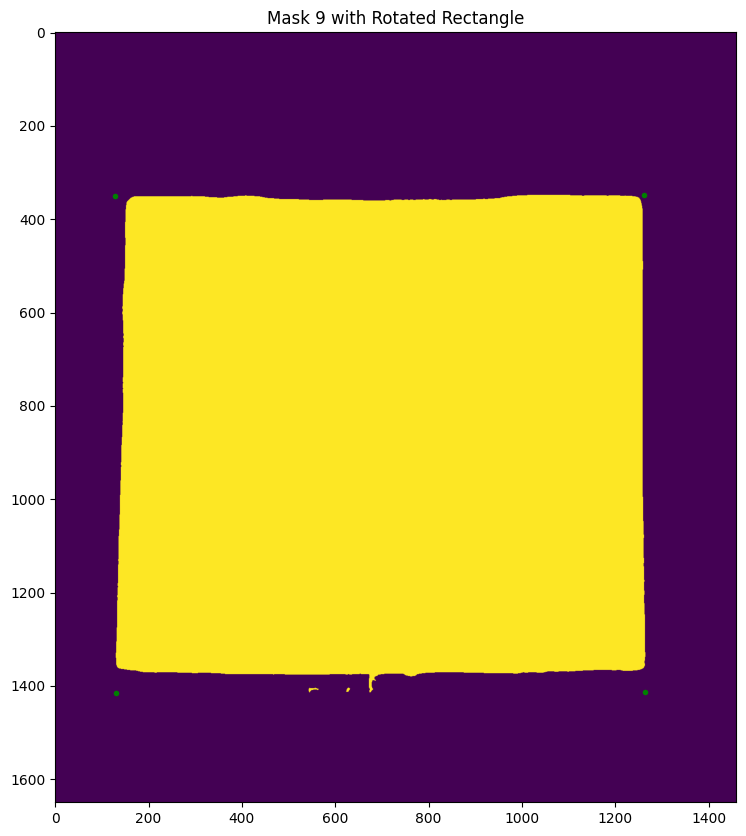

Rotated Rectangle for Mask 10: [[  90.960754 1393.4149  ]
 [ 163.12286   385.55063 ]
 [1288.2998    466.11218 ]
 [1216.1377   1473.9764  ]]


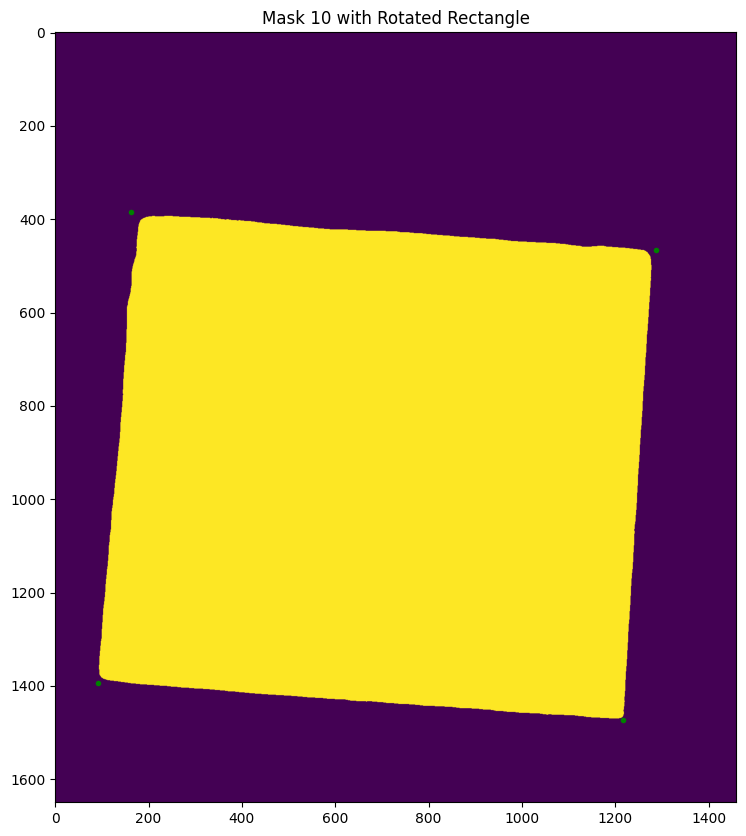

Rotated Rectangle for Mask 11: [[ 160.59338  316.7682 ]
 [1282.4454   293.24548]
 [1304.5048  1345.3057 ]
 [ 182.65271 1368.8284 ]]


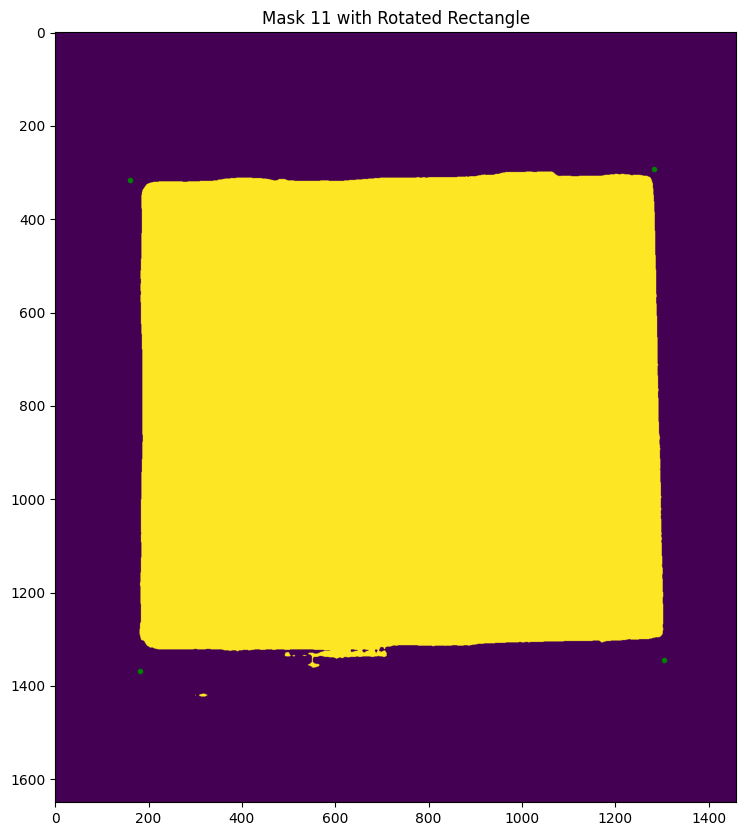

Rotated Rectangle for Mask 12: [[ 149.78032  447.7409 ]
 [1282.222    427.0097 ]
 [1301.0353  1454.679  ]
 [ 168.5935  1475.4102 ]]


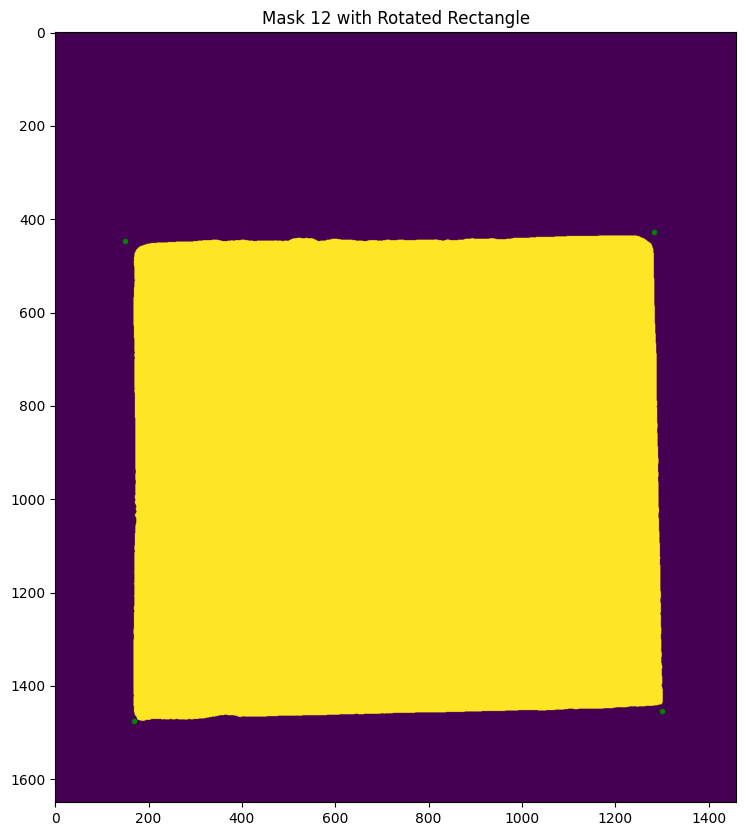

Rotated Rectangle for Mask 13: [[ 146.06656  394.31335]
 [1279.9371   372.3202 ]
 [1300.1519  1414.5013 ]
 [ 166.28125 1436.4945 ]]


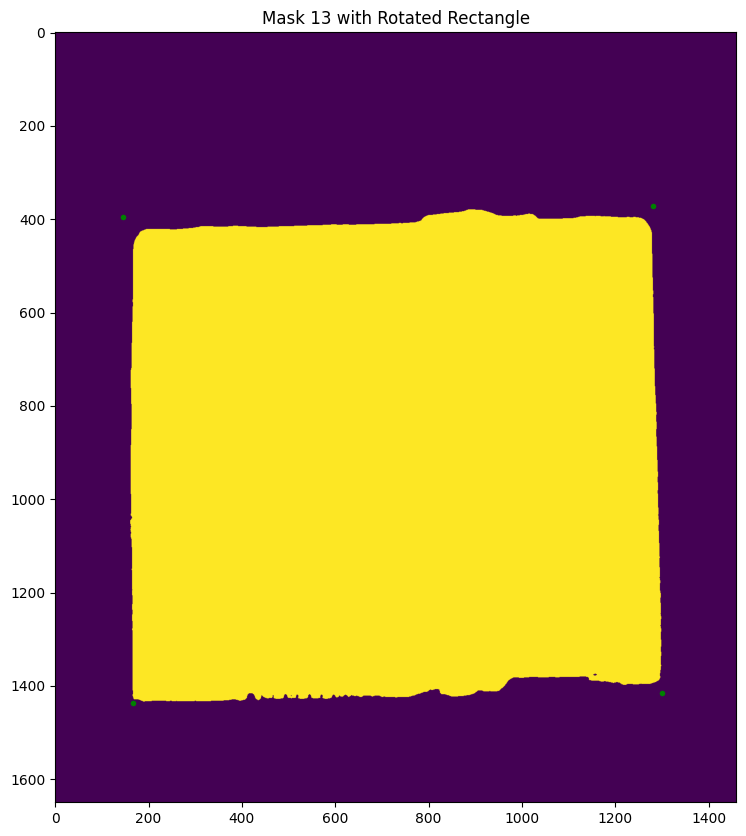

Rotated Rectangle for Mask 14: [[ 162.74762 1397.9672 ]
 [ 168.53351  366.9255 ]
 [1303.5427   373.2948 ]
 [1297.7568  1404.3364 ]]


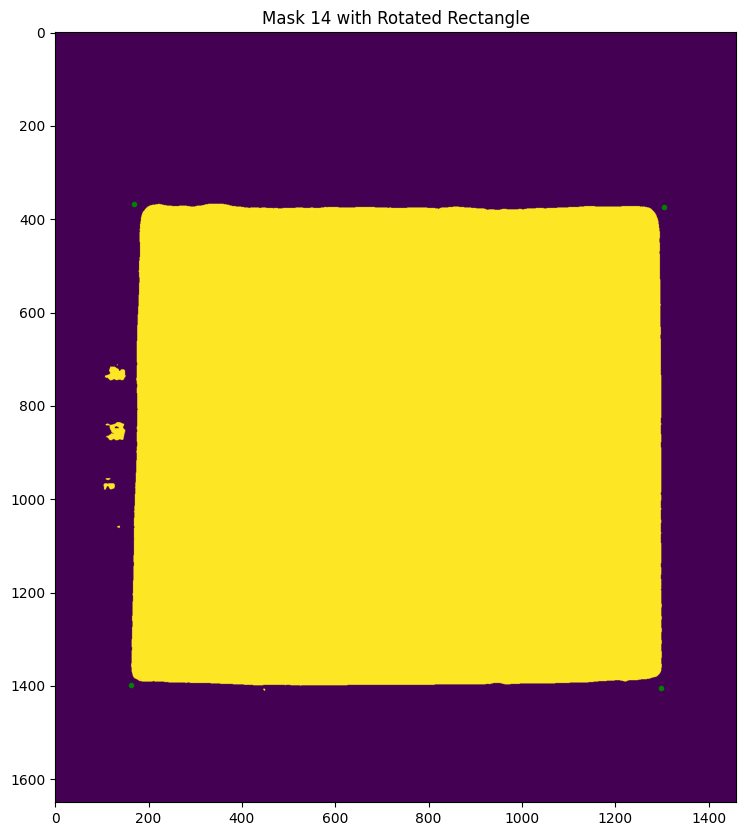

Rotated Rectangle for Mask 15: [[ 143.09497 1237.4395 ]
 [ 165.0503   183.58434]
 [1309.0537   207.41772]
 [1287.0984  1261.2728 ]]


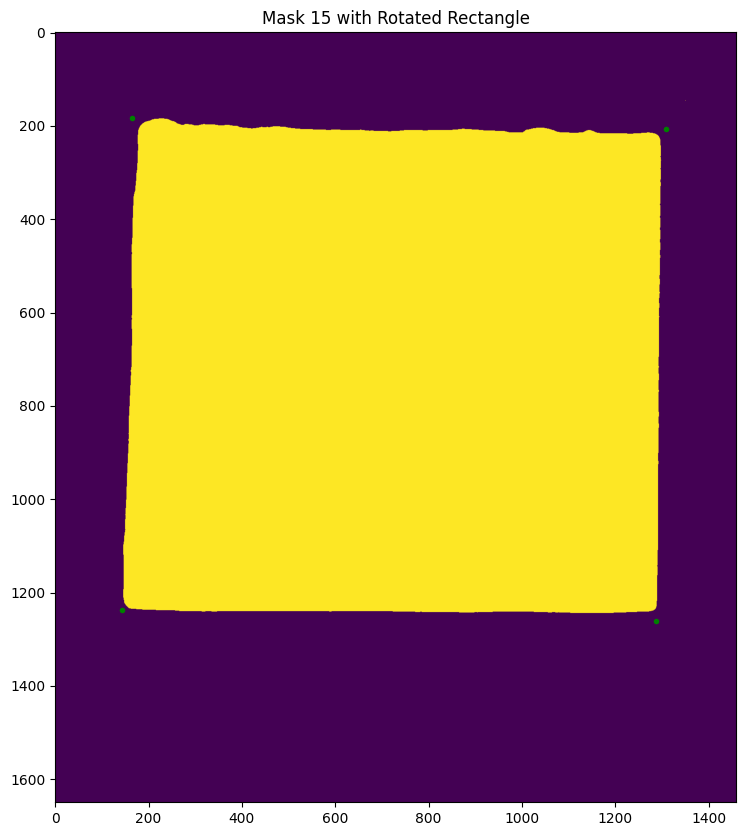

In [20]:
# prompt: Given a cleaned mask, get a rotated rectangle bounding polygon

import cv2
import numpy as np

def get_rotation_angle(bbox):
       """Calculates the rotation angle of a rotated rectangle.

       Args:
           bbox: A NumPy array of shape (4, 2) representing the vertices
               of the rotated rectangle.

       Returns:
           The rotation angle in degrees.
       """
       # Get the coordinates of two adjacent points (e.g., top-left and top-right)
       x1, y1 = bbox[0]  # Top-left point
       x2, y2 = bbox[1]  # Top-right point

       # Calculate the angle using arctangent (atan2)
       angle_rad = np.arctan2(y2 - y1, x2 - x1)
       angle_deg = np.degrees(angle_rad)

       return angle_deg

def get_rotated_rect_polygon(mask):
    global largest_contour_a
    """
    Calculates the rotated rectangle bounding polygon of a binary mask.

    Args:
        mask: A NumPy array representing the binary mask (True/False or 0/1).

    Returns:
        A NumPy array of shape (4, 2) representing the vertices of the rotated rectangle,
        or None if the mask is empty or invalid.
    """
    if not isinstance(mask, np.ndarray) or mask.ndim != 2:
        print("Error: Invalid mask format. Must be a 2D NumPy array.")
        return None

    # Find contours in the mask
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        print("Error: No contours found in the mask.")
        return None

    # Get the largest contour (assuming it's the main object)
    largest_contour = max(contours, key=cv2.contourArea)

    # Fit a rotated rectangle to the contour
    rotated_rect = cv2.minAreaRect(largest_contour)

    # Get the four vertices of the rotated rectangle
    box = cv2.boxPoints(rotated_rect)
    # box = np.int0(box)

    return box

# Iterate over the first 15 masks
for i, mask in enumerate(all_masks[:15]):
    # Reshape the mask if necessary
    h, w = mask.shape[-2:]
    mask = mask.reshape(h, w)  # or mask.squeeze() if it has an extra dimension

    # Get the rotated rectangle for the current mask
    bbox = get_rotated_rect_polygon(mask)

    # Print the vertices (optional)
    print(f"Rotated Rectangle for Mask {i+1}: {bbox}")

    angle = get_rotation_angle(bbox)
    # print(f"Rotation Angle for Mask {i+1}: {angle} degrees")

    # Visualize the mask and the rotated rectangle (optional)
    plt.figure(figsize=(10, 10))
    plt.imshow(mask)
    if bbox is not None:  # Check if bbox was found
        for point in bbox:
            plt.plot(point[0], point[1], marker='o', markersize=3, color='green')
    plt.title(f"Mask {i+1} with Rotated Rectangle")
    plt.show()